In [14]:
import warnings
from pprint import pprint
from collections import Counter
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from graphrole import RecursiveFeatureExtractor, RoleExtractor

In [3]:
students = pd.read_csv("../data/6-student_merged.csv", sep=";", dtype={'from_hei': "string", 'to_hei': "string", 'level': 'category', 'language:': "category",
                       'year': "category", 'gender': "category", 'nationality': "category", 'previous': "category", 'qualification': "category", 'languageprep': "category"})

#Remove white spaces
students['from_hei'] = students['from_hei'].str.replace(" ", "_")
students['to_hei'] = students['to_hei'].str.replace(" ", "_")


print(students.dtypes)


from_hei           string
to_hei             string
age                 int64
gender           category
nationality      category
subject             int64
subject1            int64
level            category
yearsprior          int64
duration          float64
credit              int64
language           object
languageprep     category
sevsupp           float64
grant             float64
previous         category
qualification    category
year             category
distance          float64
direction         float64
dtype: object


In [4]:
print(students)

from_hei        to_hei  age gender nationality  subject  \
0        D__KONSTAN01     UK_BATH01   25      M          DE      310   
1        D__KONSTAN01   F__PARIS007   24      M          DE      461   
2        D__KONSTAN01  F__MARSEIL16   23      M          DE      314   
3        D__KONSTAN01  E__CORDOBA01   24      F          DE      222   
4        EE_TALLINN04    SF_LAHTI11   22      M          EE       34   
...               ...           ...  ...    ...         ...      ...   
1162424  TR_ISTANBU25   PL_KRAKOW03    0      M           0       48   
1162425  TR_ISTANBU25  S__TROLLHA01    0      M           0        5   
1162426  TR_ISTANBU25  S__TROLLHA01    0      M           0        5   
1162427  TR_ISTANBU25  UK_LONDON134    0      F           0       34   
1162428  TR_ISTANBU25  E__CORDOBA01    0      F           0      222   

         subject1 level  yearsprior  duration  credit language languageprep  \
0               3     1           2       4.0      27       EN       

In [5]:
G = nx.Graph()
print("# of nodes: ", G.number_of_nodes())
print("# of edges: ", G.number_of_edges())

# of nodes:  0
# of edges:  0


In [6]:
#Get nodes (hei codes)
nodes_out = set(students.from_hei.unique())
nodes_in = set(students.to_hei.unique())
nodes = nodes_out.union(nodes_in)
print(len(list(nodes)))

#G.add_nodes_from(nodes_for_adding = list(nodes))

3292


In [7]:
#Get edges
'''
Weighted
Directed
'''
#print(nodes)
grouped_st = students.groupby(['from_hei', 'to_hei'])#.size()
#print(grouped_st)
for key, el in grouped_st:
    #print(len(el)
    #Node for key[0], key[1], len(el)
    G.add_edge(key[0], key[1], weight=len(el))


In [8]:
#Print g info
print("# of nodes: ", G.number_of_nodes())
print("# of edges: ", G.number_of_edges())

# of nodes:  3292
# of edges:  104226


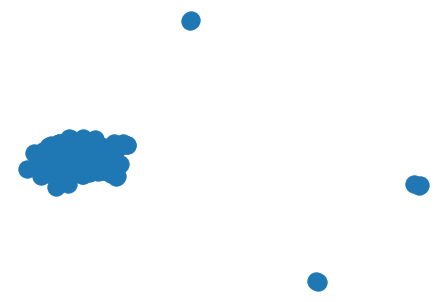

In [71]:
# plot graph
plt.figure()

with warnings.catch_warnings():
    # catch matplotlib deprecation warning
    warnings.simplefilter('ignore')
    nx.draw(
        G,
        pos=nx.spring_layout(G, seed=42)
    )

plt.show()

In [73]:
#Write graph as an edge list

nx.write_weighted_edgelist(G, '../graphs/edge_list.csv')

# Apply RolX

In [9]:
#Extract features
feature_extractor = RecursiveFeatureExtractor(G)
features = feature_extractor.extract_features()

print(f'\nFeatures extracted from {feature_extractor.generation_count} recursive generations:')
print(features)


Features extracted from 6 recursive generations:
              degree(mean)(mean)(mean)(mean)(mean)  \
A__BADEN01                             1634.500719   
A__DORNBIR01                           1591.643597   
A__EISENST01                           1634.235426   
A__EISENST02                           1603.422512   
A__EISENST05                           1200.267457   
...                                            ...   
Unknown_PT                             1616.867518   
Unknown_S                              1619.066165   
Unknown_SK                             1607.812576   
Unknown_TR                             1641.815250   
Unknown_UK                             1602.316508   

              external_edges(mean)(mean)(mean)(mean)(mean)  \
A__BADEN01                                   201286.211599   
A__DORNBIR01                                 196710.031658   
A__EISENST01                                 201300.362257   
A__EISENST02                                 198054.8

In [13]:
#Extract roles
role_extractor = RoleExtractor(n_roles=None)
role_extractor.extract_role_factors(features)
node_roles = role_extractor.roles


Node role assignments:

Node role membership by percentage:
              role_0  role_1  role_2  role_3  role_4  role_5  role_6  role_7
A__BADEN01      0.02    0.02    0.02    0.02    0.45    0.02    0.02    0.45
A__DORNBIR01    0.01    0.56    0.01    0.01    0.01    0.20    0.20    0.01
A__EISENST01    0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12
A__EISENST02    0.01    0.56    0.01    0.01    0.01    0.20    0.20    0.01
A__EISENST05    0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12
...              ...     ...     ...     ...     ...     ...     ...     ...
Unknown_PT      0.02    0.45    0.02    0.02    0.02    0.02    0.45    0.02
Unknown_S       0.00    0.38    0.00    0.00    0.00    0.22    0.00    0.38
Unknown_SK      0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12
Unknown_TR      0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12
Unknown_UK      0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12

[3292 rows x 8

In [31]:
#Print role info

'''
print('\nNode role assignments:')
pprint(node_roles)
'''

print('\nNode role membership by percentage:')
print(role_extractor.role_percentage.round(2))

role_count = Counter(node_roles.values())
pprint(role_count)


Node role membership by percentage:
              role_0  role_1  role_2  role_3  role_4  role_5  role_6  role_7
A__BADEN01      0.02    0.02    0.02    0.02    0.45    0.02    0.02    0.45
A__DORNBIR01    0.01    0.56    0.01    0.01    0.01    0.20    0.20    0.01
A__EISENST01    0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12
A__EISENST02    0.01    0.56    0.01    0.01    0.01    0.20    0.20    0.01
A__EISENST05    0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12
...              ...     ...     ...     ...     ...     ...     ...     ...
Unknown_PT      0.02    0.45    0.02    0.02    0.02    0.02    0.45    0.02
Unknown_S       0.00    0.38    0.00    0.00    0.00    0.22    0.00    0.38
Unknown_SK      0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12
Unknown_TR      0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12
Unknown_UK      0.12    0.12    0.12    0.12    0.12    0.12    0.12    0.12

[3292 rows x 8 columns]
Counter({'role

# Analyze Graph Stats

In [21]:
#Connected components

print("Number of connected components: ", nx.number_connected_components(G))

G_components = [G.subgraph(c).copy() for c in nx.connected_components(G)]

for num, c in enumerate(G_components):
    print(f"Component {num}, {c.number_of_nodes()} nodes")
    

Number of connected components:  4
Component 0, 3285 nodes
Component 1, 2 nodes
Component 2, 2 nodes
Component 3, 3 nodes


In [33]:
#Analyze components 1, 2 and 3

components_nodes = []
for num in [1,2,3]:
    c = G_components[num]
    print(f"Component {num}: {c.nodes}")
    for node in c.nodes:
        components_nodes.append(node)

print(components_nodes)

for node in components_nodes:
    print(f"University {node}, role: {node_roles[node]}")

Component 1: ['E__LLEIDA11', 'UK_OMAGH01']
Component 2: ['UK_MAIDSTO03', 'F__ST-ETIE29']
Component 3: ['HR_VARAZDI02', 'SI_NOVO-ME06', 'HR_VARAZDI01']
['E__LLEIDA11', 'UK_OMAGH01', 'UK_MAIDSTO03', 'F__ST-ETIE29', 'HR_VARAZDI02', 'SI_NOVO-ME06', 'HR_VARAZDI01']
University E__LLEIDA11, role: role_0
University UK_OMAGH01, role: role_0
University UK_MAIDSTO03, role: role_0
University F__ST-ETIE29, role: role_0
University HR_VARAZDI02, role: role_0
University SI_NOVO-ME06, role: role_0
University HR_VARAZDI01, role: role_0


Component 1: ESCOLA LES HEURES (Spain) and SOUTH WEST COLLEGE (UK)

Component 2: EUROPEAN SCHOOL OF OSTEOPATHY (UK) and CIDO, CENTRE INTERNATIONAL D'OSTÉOPATHIE (France)

Component 3: Sveuciliste Sjever (Croatia), VISOKA ŠOLA ZA ZDRAVSTVO NOVO MESTO (Slovenia), and VELEUČILIŠTE U VARAŽDINU (Croatia)

# Observe features for roles

In [56]:
roles_values = list(node_roles.values())
roles_keys = list(node_roles.keys())

#add roles_values to features dataset
features['roles'] = roles_values

#Group by roles and take mean of the features
#grouped_st = students.groupby(['from_hei', 'to_hei'])#.size()

grouped_feat = features.groupby('roles').mean()

print(grouped_feat)

degree(mean)(mean)(mean)(mean)(mean)  \
roles                                          
role_0                           1545.289299   
role_1                           1587.951359   
role_2                           1640.151343   
role_3                           1503.603221   
role_4                           1640.736248   
role_6                           1649.591032   
role_7                           1636.945876   

        external_edges(mean)(mean)(mean)(mean)(mean)  \
roles                                                  
role_0                                 191276.002312   
role_1                                 196132.670656   
role_2                                 201830.321225   
role_3                                 185650.208883   
role_4                                 201669.427216   
role_6                                 202302.504363   
role_7                                 201417.246385   

        degree(mean)(mean)(mean)(mean)  \
roles                       